
## Project

#### Installing the Packages

In [42]:
library(tidyverse)
library(dplyr)
library(skimr)
library(readr)
#library(vis_dat)
library(dbplyr)
#install.packages("xlsReadWrite")
require("xlsReadWrite")
library(tabulizer)
#library(purrr)

Loading required package: xlsReadWrite

Warning message in library(package, lib.loc = lib.loc, character.only = TRUE, logical.return = TRUE, :
"there is no package called 'xlsReadWrite'"


In [43]:
library("countrycode")



#### First we are working on GHE2016_YLL-2016-country.xls Dataset which will give us YLL for each Country. This is a very messy and unstructured Data, hence needs lot of cleaning



#### Reading Dataset which gives us information on YLL for Different countries

In [44]:
library("readxl")
file1 <- read_xls("GHE2016_YLL-2016-country.xls", sheet=2, )

New names:
* `` -> ...1
* `` -> ...2
* `` -> ...3
* `` -> ...5
* `` -> ...6
* ... and 184 more problems



In [45]:
file1 %>% nrow()

[1] 660

#### Omitting the first five rows as it is not applicable
#### As we want to make the first row as our column name and we have few NA values in it, hence we are inserting the column number wherever column name is NA

In [46]:
subset_df <- file1[6:660,] 
"column3" -> subset_df[1,3] 
"column5" -> subset_df[1,5]
"column6" -> subset_df[1,6]


In [47]:
subset_df %>% nrow()

[1] 655

In [48]:
subset_df

...1,...2,...3,World Health Organization,...5,...6,...7,...8,...9,...10,...,...181,...182,...183,...184,...185,...186,...187,...188,...189,...190
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Sex,GHE code,column3,GHE cause,column5,column6,Member State (See Notes for explanation of colour codes),Afghanistan,Albania,Algeria,...,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Yemen,Zambia,Zimbabwe
NA,NA,NA,NA,NA,NA,ISO-3 Code,AFG,ALB,DZA,...,TZA,USA,URY,UZB,VUT,VEN,VNM,YEM,ZMB,ZWE
NA,NA,NA,NA,NA,NA,NA,4,3,4,...,5,1,2,1,4,2,4,4,5,5
Persons,NA,NA,Population ('000) (2),NA,NA,NA,34656,2926,40606,...,55572,322180,3444,31447,270,31568,94569,27584,16591,16150
Persons,0,NA,All Causes,NA,NA,NA,14599.503959,574.94814953599996,6545.39625781,...,22746.7643594,60988.333046899999,688.25181762700004,5843.7187246100002,50.805753143300002,6363.8660429700003,16636.7541953,9128.3697773399999,7450.96819727,7079.9152539099996
Persons,10,I.,"Communicable, maternal, perinatal and nutritional conditions",NA,NA,NA,7255.5209987799999,33.655244598400003,1874.71801807,...,15062.751291,3882.3739008799998,62.707683858899998,1326.0605636,16.188229045899998,1055.17022314,3290.5616142600002,3968.1087141100002,5225.1548168899999,4533.4190307600002
Persons,20,NA,A.,Infectious and parasitic diseases,NA,NA,2008.05055176,6.2966193122899998,323.525047852,...,7581.51341211,1360.7979729000001,22.6731417789,318.40869647199997,5.9667286930100003,334.07739001499999,1372.54755664,1078.59902478,2938.2374160200002,2404.89530225
Persons,30,NA,NA,1.,Tuberculosis,NA,498.56067236299998,0.204148178816,95.191013503999997,...,1286.55609351,14.4653267365,2.4366462653899998,83.306139499699995,0.80757564318200004,28.980557773600001,340.06487548799998,77.288050979600001,234.92023699999999,59.559673965499996
Persons,40,NA,NA,2.,STDs excluding HIV,NA,198.842573681,0.028585897192000002,9.5036536596700003,...,305.11968832000002,5.28600838852,0.33009869527800001,4.0743866476999999,0.80650751549199995,5.2976981828199996,22.383542894800001,299.15376728699999,46.037618094199999,38.404121162199999


#### Changing the first row into column Header

In [49]:
colnames(subset_df) <- as.character(unlist(subset_df[1,]))
colnames(subset_df) = subset_df[1, ]
subset_df <- subset_df[-1, ]

colnames(subset_df)[4] <- "Cause"
subset_df2 <- subset_df
subset_df

Sex,GHE code,column3,Cause,column5,column6,Member State (See Notes for explanation of colour codes),Afghanistan,Albania,Algeria,...,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Yemen,Zambia,Zimbabwe
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
NA,NA,NA,NA,NA,NA,ISO-3 Code,AFG,ALB,DZA,...,TZA,USA,URY,UZB,VUT,VEN,VNM,YEM,ZMB,ZWE
NA,NA,NA,NA,NA,NA,NA,4,3,4,...,5,1,2,1,4,2,4,4,5,5
Persons,NA,NA,Population ('000) (2),NA,NA,NA,34656,2926,40606,...,55572,322180,3444,31447,270,31568,94569,27584,16591,16150
Persons,0,NA,All Causes,NA,NA,NA,14599.503959,574.94814953599996,6545.39625781,...,22746.7643594,60988.333046899999,688.25181762700004,5843.7187246100002,50.805753143300002,6363.8660429700003,16636.7541953,9128.3697773399999,7450.96819727,7079.9152539099996
Persons,10,I.,"Communicable, maternal, perinatal and nutritional conditions",NA,NA,NA,7255.5209987799999,33.655244598400003,1874.71801807,...,15062.751291,3882.3739008799998,62.707683858899998,1326.0605636,16.188229045899998,1055.17022314,3290.5616142600002,3968.1087141100002,5225.1548168899999,4533.4190307600002
Persons,20,NA,A.,Infectious and parasitic diseases,NA,NA,2008.05055176,6.2966193122899998,323.525047852,...,7581.51341211,1360.7979729000001,22.6731417789,318.40869647199997,5.9667286930100003,334.07739001499999,1372.54755664,1078.59902478,2938.2374160200002,2404.89530225
Persons,30,NA,NA,1.,Tuberculosis,NA,498.56067236299998,0.204148178816,95.191013503999997,...,1286.55609351,14.4653267365,2.4366462653899998,83.306139499699995,0.80757564318200004,28.980557773600001,340.06487548799998,77.288050979600001,234.92023699999999,59.559673965499996
Persons,40,NA,NA,2.,STDs excluding HIV,NA,198.842573681,0.028585897192000002,9.5036536596700003,...,305.11968832000002,5.28600838852,0.33009869527800001,4.0743866476999999,0.80650751549199995,5.2976981828199996,22.383542894800001,299.15376728699999,46.037618094199999,38.404121162199999
Persons,50,NA,NA,NA,a.,Syphilis,198.034113776,0.017194270082000002,9.2546052925000009,...,295.52140637399998,2.5979375133499998,0.21974247455599999,3.8925203821699998,0.79769336422199999,5.0684172173100004,21.816483183399999,298.36688494100002,42.798473969699998,34.994711214900001


In [50]:
subset_df2 %>% nrow

[1] 654

#### Subsetting the dataset into Males, Females and Persons for further cleaning

In [51]:
subset_df1 <- subset_df[-c(1:4),]
Males <- subset_df1 %>% filter(Sex == "Males") 
Males <- Males[-c(1,2),]

Females <- subset_df1 %>% filter(Sex == "Females") 
Females <- Females[-c(1,2),]
Persons <- subset_df1 %>% filter(Sex == "Persons")


In [52]:
subset_df1 %>% nrow()

[1] 650

In [53]:
subset_df1

Sex,GHE code,column3,Cause,column5,column6,Member State (See Notes for explanation of colour codes),Afghanistan,Albania,Algeria,...,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Yemen,Zambia,Zimbabwe
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Persons,10,I.,"Communicable, maternal, perinatal and nutritional conditions",NA,NA,NA,7255.5209987799999,33.655244598400003,1874.71801807,...,15062.751291,3882.3739008799998,62.707683858899998,1326.0605636,16.188229045899998,1055.17022314,3290.5616142600002,3968.1087141100002,5225.1548168899999,4533.4190307600002
Persons,20,NA,A.,Infectious and parasitic diseases,NA,NA,2008.05055176,6.2966193122899998,323.525047852,...,7581.51341211,1360.7979729000001,22.6731417789,318.40869647199997,5.9667286930100003,334.07739001499999,1372.54755664,1078.59902478,2938.2374160200002,2404.89530225
Persons,30,NA,NA,1.,Tuberculosis,NA,498.56067236299998,0.204148178816,95.191013503999997,...,1286.55609351,14.4653267365,2.4366462653899998,83.306139499699995,0.80757564318200004,28.980557773600001,340.06487548799998,77.288050979600001,234.92023699999999,59.559673965499996
Persons,40,NA,NA,2.,STDs excluding HIV,NA,198.842573681,0.028585897192000002,9.5036536596700003,...,305.11968832000002,5.28600838852,0.33009869527800001,4.0743866476999999,0.80650751549199995,5.2976981828199996,22.383542894800001,299.15376728699999,46.037618094199999,38.404121162199999
Persons,50,NA,NA,NA,a.,Syphilis,198.034113776,0.017194270082000002,9.2546052925000009,...,295.52140637399998,2.5979375133499998,0.21974247455599999,3.8925203821699998,0.79769336422199999,5.0684172173100004,21.816483183399999,298.36688494100002,42.798473969699998,34.994711214900001
Persons,60,NA,NA,NA,b.,Chlamydia,0.16352473402000001,0.0021364535170000001,0.046650939256000001,...,1.9212181717200001,0.52089660453800002,0.021060922980000001,0.037999717592999999,0.001737149946,0.044215649426000002,0.1024497962,0.157199278474,0.65604000905199999,0.686656118393
Persons,70,NA,NA,NA,c.,Gonorrhoea,0.40530647903299999,0.0061454761259999999,0.132567722591,...,4.8333202472099996,1.49138732505,0.059351533025999999,0.093384827732999998,0.0045377471920000001,0.120585059434,0.32167462381700002,0.401256780408,1.6324562666,1.79259890045
Persons,80,NA,NA,NA,d.,Trichomoniasis,.,.,.,...,.,.,.,.,.,.,.,.,.,.
Persons,85,NA,NA,NA,e.,Genital herpes,.,.,.,...,.,.,.,.,.,.,.,.,.,.


#### Imputation is needed for column 4 and column 5 as lots of NA is there when we are loading dataset, as it is not in proper structure

#### Inserting a wherever NA which is required for the function I have created to impute the NA values

In [54]:
colnames(Males)[4] <- "Cause"
Males$Cause[is.na(Males$Cause)] <- "a"
Males %>% nrow()

[1] 214

In [55]:
colnames(Females)[4] <- "Cause"
Females$Cause[is.na(Females$Cause)] <- "a"
Females %>% nrow()

[1] 214

In [56]:
colnames(Persons)[4] <- "Cause"
Persons$Cause[is.na(Persons$Cause)] <- "a"
Persons %>% nrow()

[1] 214

#### Imputing the different categories of the disease such as Communicable, Non-communicable and Injuries in the dataset. Imputing column 4

In [57]:
filling <- function(DF,disease1,disease2,disease3){
    for(i in 1:61){
        
            if(DF[i,4] == disease1){
            break
            }
            else{
                DF[i,4] <- disease2
            }
        
        }
    for(i in 62:200){
        
            if(DF[i,4] == disease3){
            break
            }
            else{
                DF[i,4] <- disease1
            }
        
        }
   
   for(i in 201:214){
        
           
                DF[i,4] <- disease3
            
        
        }
    return(DF)
}

#### Imputation for males, females and persons separately

In [58]:
Males <- filling(Males,"Noncommunicable diseases","Communicable, maternal, perinatal and nutritional conditions","Injuries")
Males

Sex,GHE code,column3,Cause,column5,column6,Member State (See Notes for explanation of colour codes),Afghanistan,Albania,Algeria,...,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Yemen,Zambia,Zimbabwe
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Males,10,I.,"Communicable, maternal, perinatal and nutritional conditions",NA,NA,NA,3688.3977812500002,19.462444625900002,927.95963134800002,...,8015.4252070299999,2080.9746552699999,35.255803085300002,763.61067394999998,8.9301186447099994,609.89126220699995,2060.0629609399998,2002.2238942900001,2768.42625684,2272.8149804700001
Males,20,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,NA,NA,1016.75328345,3.6650986785900002,162.560765137,...,4250.6069003900002,755.07670605500005,13.8187448254,200.88965403700001,3.5821717300399998,214.854901611,985.75445214800004,532.87534851099997,1558.85739575,1208.21770569
Males,30,NA,"Communicable, maternal, perinatal and nutritional conditions",1.,Tuberculosis,NA,220.40640710400001,0.12668531018500001,46.366573013299998,...,887.92822558600005,9.3616054153399997,1.8357830044000001,54.519634681699998,0.49627241206200001,20.173038192700002,230.391631958,34.989658431999999,151.899824341,38.686214767499997
Males,40,NA,"Communicable, maternal, perinatal and nutritional conditions",2.,STDs excluding HIV,NA,86.545504189300004,0.011415939294,4.1300544482200001,...,135.30104817599999,1.4204230689999999,0.120552850246,1.92515895081,0.37548738649500002,2.5489724540699998,11.3047246194,151.30072433800001,19.3530991079,15.3059575498
Males,50,NA,"Communicable, maternal, perinatal and nutritional conditions",NA,a.,Syphilis,86.529671582899994,0.010402219132,4.1181517554499996,...,134.948802847,1.3454716119800001,0.116435302258,1.92187118149,0.37538164218699999,2.5364019045799999,11.2488712683,151.278164809,19.231864811099999,15.29645378
Males,60,NA,"Communicable, maternal, perinatal and nutritional conditions",NA,b.,Chlamydia,.,.,.,...,.,.,.,.,.,.,.,.,.,.
Males,70,NA,"Communicable, maternal, perinatal and nutritional conditions",NA,c.,Gonorrhoea,0.010839208778000001,0.00064057255600000001,0.0080133523069999997,...,0.235723959964,0.039295108556999997,0.002291334957,0.0021271011829999999,6.7949185999999998e-005,0.007383858353,0.036441680044000002,0.015587888919,0.082758049089000002,0.006416145935
Males,80,NA,"Communicable, maternal, perinatal and nutritional conditions",NA,d.,Trichomoniasis,.,.,.,...,.,.,.,.,.,.,.,.,.,.
Males,85,NA,"Communicable, maternal, perinatal and nutritional conditions",NA,e.,Genital herpes,.,.,.,...,.,.,.,.,.,.,.,.,.,.


In [59]:
Females <- filling(Females,"Noncommunicable diseases","Communicable, maternal, perinatal and nutritional conditions","Injuries")
Females

Sex,GHE code,column3,Cause,column5,column6,Member State (See Notes for explanation of colour codes),Afghanistan,Albania,Algeria,...,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Yemen,Zambia,Zimbabwe
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Females,10,I.,"Communicable, maternal, perinatal and nutritional conditions",NA,NA,NA,3567.1232175300001,14.1927999725,946.75838671899999,...,7047.3260839799996,1801.39924561,27.451880773500001,562.44988964799995,7.2581104011499997,445.27896093800001,1230.4986533199999,1965.8848198200001,2456.7285600599998,2260.60405029
Females,20,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,NA,NA,991.29726831100004,2.6315206337000001,160.964282715,...,3330.9065117199998,605.72126684600005,8.8543969535800002,117.519042435,2.3845569629700001,119.222488403,386.793104492,545.72367627000006,1379.38002026,1196.67759656
Females,30,NA,"Communicable, maternal, perinatal and nutritional conditions",1.,Tuberculosis,NA,278.154265259,0.077462868631000006,48.824440490699999,...,398.62786792000003,5.1037213211100001,0.600863260984,28.786504818000001,0.31130323112000002,8.8075195808399993,109.67324352999999,42.298392547600002,83.020412658699996,20.873459197999999
Females,40,NA,"Communicable, maternal, perinatal and nutritional conditions",2.,STDs excluding HIV,NA,112.29706949200001,0.017169957898999999,5.3735992114500002,...,169.81864014300001,3.8655853195200001,0.20954584503199999,2.1492276969000002,0.43102012899699998,2.7487257287500002,11.0788182755,147.85304294900001,26.684518986200001,23.0981636124
Females,50,NA,"Communicable, maternal, perinatal and nutritional conditions",NA,a.,Syphilis,111.504442193,0.0067920509499999997,5.1364535370500004,...,160.57260352700001,1.2524659013699999,0.103307172298,1.97064920068,0.422311722035,2.53201531273,10.567611915100001,147.08872013199999,23.566609158599999,19.698257434799999
Females,60,NA,"Communicable, maternal, perinatal and nutritional conditions",NA,b.,Chlamydia,0.16352473402000001,0.0021364535170000001,0.046650939256000001,...,1.9212181717200001,0.52089660453800002,0.021060922980000001,0.037999717592999999,0.001737149946,0.044215649426000002,0.1024497962,0.157199278474,0.65604000905199999,0.686656118393
Females,70,NA,"Communicable, maternal, perinatal and nutritional conditions",NA,c.,Gonorrhoea,0.394467270255,0.0055049035699999997,0.124554370284,...,4.59759628725,1.4520922164900001,0.057060198069,0.091257726550000001,0.0044697980059999996,0.113201201081,0.28523294377300001,0.38566889149,1.54969821751,1.78618275452
Females,80,NA,"Communicable, maternal, perinatal and nutritional conditions",NA,d.,Trichomoniasis,.,.,.,...,.,.,.,.,.,.,.,.,.,.
Females,85,NA,"Communicable, maternal, perinatal and nutritional conditions",NA,e.,Genital herpes,.,.,.,...,.,.,.,.,.,.,.,.,.,.


In [60]:
Persons <- filling(Persons,"Noncommunicable diseases","Communicable, maternal, perinatal and nutritional conditions","Injuries")
Persons

Sex,GHE code,column3,Cause,column5,column6,Member State (See Notes for explanation of colour codes),Afghanistan,Albania,Algeria,...,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Yemen,Zambia,Zimbabwe
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Persons,10,I.,"Communicable, maternal, perinatal and nutritional conditions",NA,NA,NA,7255.5209987799999,33.655244598400003,1874.71801807,...,15062.751291,3882.3739008799998,62.707683858899998,1326.0605636,16.188229045899998,1055.17022314,3290.5616142600002,3968.1087141100002,5225.1548168899999,4533.4190307600002
Persons,20,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,NA,NA,2008.05055176,6.2966193122899998,323.525047852,...,7581.51341211,1360.7979729000001,22.6731417789,318.40869647199997,5.9667286930100003,334.07739001499999,1372.54755664,1078.59902478,2938.2374160200002,2404.89530225
Persons,30,NA,"Communicable, maternal, perinatal and nutritional conditions",1.,Tuberculosis,NA,498.56067236299998,0.204148178816,95.191013503999997,...,1286.55609351,14.4653267365,2.4366462653899998,83.306139499699995,0.80757564318200004,28.980557773600001,340.06487548799998,77.288050979600001,234.92023699999999,59.559673965499996
Persons,40,NA,"Communicable, maternal, perinatal and nutritional conditions",2.,STDs excluding HIV,NA,198.842573681,0.028585897192000002,9.5036536596700003,...,305.11968832000002,5.28600838852,0.33009869527800001,4.0743866476999999,0.80650751549199995,5.2976981828199996,22.383542894800001,299.15376728699999,46.037618094199999,38.404121162199999
Persons,50,NA,"Communicable, maternal, perinatal and nutritional conditions",NA,a.,Syphilis,198.034113776,0.017194270082000002,9.2546052925000009,...,295.52140637399998,2.5979375133499998,0.21974247455599999,3.8925203821699998,0.79769336422199999,5.0684172173100004,21.816483183399999,298.36688494100002,42.798473969699998,34.994711214900001
Persons,60,NA,"Communicable, maternal, perinatal and nutritional conditions",NA,b.,Chlamydia,0.16352473402000001,0.0021364535170000001,0.046650939256000001,...,1.9212181717200001,0.52089660453800002,0.021060922980000001,0.037999717592999999,0.001737149946,0.044215649426000002,0.1024497962,0.157199278474,0.65604000905199999,0.686656118393
Persons,70,NA,"Communicable, maternal, perinatal and nutritional conditions",NA,c.,Gonorrhoea,0.40530647903299999,0.0061454761259999999,0.132567722591,...,4.8333202472099996,1.49138732505,0.059351533025999999,0.093384827732999998,0.0045377471920000001,0.120585059434,0.32167462381700002,0.401256780408,1.6324562666,1.79259890045
Persons,80,NA,"Communicable, maternal, perinatal and nutritional conditions",NA,d.,Trichomoniasis,.,.,.,...,.,.,.,.,.,.,.,.,.,.
Persons,85,NA,"Communicable, maternal, perinatal and nutritional conditions",NA,e.,Genital herpes,.,.,.,...,.,.,.,.,.,.,.,.,.,.


#### Imputation of the sub_cause. Here  am first changing the name of the columns for dataset Males, Females and Person. And again I am putting a wherever NA is present.

#### We had to fill the NA though the dataset had total count of the YLL for each sub categories as for few of the categories count was not correct

In [61]:
colnames(Males)[5] <- "Sub_Cause"
Males$Sub_Cause[is.na(Males$Sub_Cause)] <- "a"
colnames(Females)[5] <- "Sub_Cause"
Females$Sub_Cause[is.na(Females$Sub_Cause)] <- "a"
colnames(Persons)[5] <- "Sub_Cause"
Persons$Sub_Cause[is.na(Persons$Sub_Cause)] <- "a"

In [63]:
filling <- function(DF,disease1,disease2,disease3,disease4,disease5,disease6,disease7,disease8,disease9,disease10,disease11,disease12,disease13,disease14,disease15,disease16,disease17,disease18,disease19,disease20,disease21,disease22){
    for(i in 1:46){
        
            if(DF[i,5] == disease1){
            break
            }
            else{
                DF[i,5] <- disease2
            }
        
        }
    for(i in 46:50){
        
            if(DF[i,5] == disease3){
            break
            }
            else{
                DF[i,5] <- disease1
            }
        
        }
    for(i in 51:55){
        
            if(DF[i,5] == disease4){
            break
            }
            else{
                DF[i,5] <- disease5
            }
        
        }
    for(i in 56:62){
        
            if(DF[i,5] == disease6){
            break
            }
            else{
                DF[i,5] <- disease4
            }
        
        }
    for(i in 63:100){
        
            if(DF[i,5] == disease7){
            break
            }
            else{
                DF[i,5] <- disease6
            }
        
        }
       for(i in 102:107){
        
            if(DF[i,5] == disease9){
            break
            }
            else{
                DF[i,5] <- disease8
            }
        
        }
    for(i in 107:128){
        
            if(DF[i,5] == disease10){
            break
            }
            else{
                DF[i,5] <- disease9
            }
        
        }
    for(i in 128:135){
        
            if(DF[i,5] == disease11){
            break
            }
            else{
                DF[i,5] <- disease10
            }
        
        }
    for(i in 136:143){
        
            if(DF[i,5] == disease12){
            break
            }
            else{
                DF[i,5] <- disease11
            }
        
        }
    for(i in 144:152){
        
            if(DF[i,5] == disease13){
            break
            }
            else{
                DF[i,5] <- disease12
            }
        
        }
    for(i in 153:156){
        
            if(DF[i,5] == disease14){
            break
            }
            else{
                DF[i,5] <- disease13
            }
        
        }
    for(i in 157:170){
        
            if(DF[i,5] == disease15){
            break
            }
            else{
                DF[i,5] <- disease14
            }
        
        }
       for(i in 171:180){
        
            if(DF[i,5] == "Skin diseases"){
            break
            }
            else{
                DF[i,5] <- "Genitourinary diseases"
            }
        
        }
      for(i in 182:187){
        
            if(DF[i,5] == "Congenital anomalies"){
            break
            }
            else{
                DF[i,5] <- "Musculoskeletal diseases"
            }
        
        }
    for(i in 188:(205-11)){
        
            if(DF[i,5] == "Oral conditions"){
            break
            }
            else{
                DF[i,5] <- "Congenital anomalies"
            }
        
        }
     for(i in 195:(210-11)){
        
            if(DF[i,5] == "Sudden infant death syndrome"){
            break
            }
            else{
                DF[i,5] <- "Oral conditions"
            }
        
        }
    for(i in 200:201){
        
            if(DF[i,5] == "Unintentional injuries"){
            break
            }
            else{
                DF[i,5] <- "Sudden infant death syndrome"
            }
        
        }
    for(i in 202:211){
        
            if(DF[i,5] == "Intentional injuries"){
            break
            }
            else{
                DF[i,5] <- "Unintentional injuries"
            }
        
        }
    for(i in 211:214){
        
           
                DF[i,5] <- "Intentional injuries"
            
        
        }
    
    return(DF)
}

In [32]:
filling <- function(DF,disease1,disease2,disease3,disease4,disease5,disease6,disease7,disease8,disease9,disease10,disease11,disease12,disease13,disease14,disease15,disease16,disease17,disease18,disease19,disease20,disease21,disease22){
    for(i in 1:46){
        
            if(DF[i,5] == disease1){
            break
            }
            else{
                DF[i,5] <- disease2
            }
        
        }
    for(i in 46:50){
        
            if(DF[i,5] == disease3){
            break
            }
            else{
                DF[i,5] <- disease1
            }
        
        }
    for(i in 51:55){
        
            if(DF[i,5] == disease4){
            break
            }
            else{
                DF[i,5] <- disease5
            }
        
        }
    for(i in 56:62){
        
            if(DF[i,5] == disease6){
            break
            }
            else{
                DF[i,5] <- disease4
            }
        
        }
    for(i in 63:100){
        
            if(DF[i,5] == disease7){
            break
            }
            else{
                DF[i,5] <- disease6
            }
        
        }
       for(i in 102:107){
        
            if(DF[i,5] == disease9){
            break
            }
            else{
                DF[i,5] <- disease8
            }
        
        }
    for(i in 107:128){
        
            if(DF[i,5] == disease10){
            break
            }
            else{
                DF[i,5] <- disease9
            }
        
        }
    for(i in 128:135){
        
            if(DF[i,5] == disease11){
            break
            }
            else{
                DF[i,5] <- disease10
            }
        
        }
    for(i in 136:143){
        
            if(DF[i,5] == disease12){
            break
            }
            else{
                DF[i,5] <- disease11
            }
        
        }
    for(i in 144:152){
        
            if(DF[i,5] == disease13){
            break
            }
            else{
                DF[i,5] <- disease12
            }
        
        }
    for(i in 153:156){
        
            if(DF[i,5] == disease14){
            break
            }
            else{
                DF[i,5] <- disease13
            }
        
        }
    for(i in 157:170){
        
            if(DF[i,5] == disease15){
            break
            }
            else{
                DF[i,5] <- disease14
            }
        
        }
       for(i in 171:180){
        
            if(DF[i,5] == "Skin diseases"){
            break
            }
            else{
                DF[i,5] <- "Genitourinary diseases"
            }
        
        }
      for(i in 182:187){
        
            if(DF[i,5] == "Congenital anomalies"){
            break
            }
            else{
                DF[i,5] <- "Musculoskeletal diseases"
            }
        
        }
    for(i in 188:(205-11)){
        
            if(DF[i,5] == "Oral conditions"){
            break
            }
            else{
                DF[i,5] <- "Congenital anomalies"
            }
        
        }
     for(i in 195:(210-11)){
        
            if(DF[i,5] == "Sudden infant death syndrome"){
            break
            }
            else{
                DF[i,5] <- "Oral conditions"
            }
        
        }
    for(i in 200:201){
        
            if(DF[i,5] == "Unintentional injuries"){
            break
            }
            else{
                DF[i,5] <- "Sudden infant death syndrome"
            }
        
        }
    for(i in 202:211){
        
            if(DF[i,5] == "Intentional injuries"){
            break
            }
            else{
                DF[i,5] <- "Unintentional injuries"
            }
        
        }
    for(i in 211:214){
        
           
                DF[i,5] <- "Intentional injuries"
            
        
        }
    
    return(DF)
}

#### Below code calls the function for inserting the required sub_cause wherever we have NA

In [64]:
Males <- filling(Males,"Respiratory Infectious","Infectious and parasitic diseases","Maternal conditions","Nutritional deficiencies","Neonatal conditions","Malignant neoplasms","Other neoplasms","Endocrine, blood, immune disorders","Mental and substance use disorders","Neurological conditions","Sense organ diseases","Cardiovascular diseases","Respiratory diseases","Digestive diseases","Genitourinary diseases","Skin diseases","Musculoskeletal diseases","Congenital anomalies","Oral conditions","Sudden infant death syndrome
","Unintentional injuries","Intentional injuries")
Males

Sex,GHE code,column3,Cause,Sub_Cause,column6,Member State (See Notes for explanation of colour codes),Afghanistan,Albania,Algeria,...,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Yemen,Zambia,Zimbabwe
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Males,10,I.,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,NA,NA,3688.3977812500002,19.462444625900002,927.95963134800002,...,8015.4252070299999,2080.9746552699999,35.255803085300002,763.61067394999998,8.9301186447099994,609.89126220699995,2060.0629609399998,2002.2238942900001,2768.42625684,2272.8149804700001
Males,20,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,NA,NA,1016.75328345,3.6650986785900002,162.560765137,...,4250.6069003900002,755.07670605500005,13.8187448254,200.88965403700001,3.5821717300399998,214.854901611,985.75445214800004,532.87534851099997,1558.85739575,1208.21770569
Males,30,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,Tuberculosis,NA,220.40640710400001,0.12668531018500001,46.366573013299998,...,887.92822558600005,9.3616054153399997,1.8357830044000001,54.519634681699998,0.49627241206200001,20.173038192700002,230.391631958,34.989658431999999,151.899824341,38.686214767499997
Males,40,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,STDs excluding HIV,NA,86.545504189300004,0.011415939294,4.1300544482200001,...,135.30104817599999,1.4204230689999999,0.120552850246,1.92515895081,0.37548738649500002,2.5489724540699998,11.3047246194,151.30072433800001,19.3530991079,15.3059575498
Males,50,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,a.,Syphilis,86.529671582899994,0.010402219132,4.1181517554499996,...,134.948802847,1.3454716119800001,0.116435302258,1.92187118149,0.37538164218699999,2.5364019045799999,11.2488712683,151.278164809,19.231864811099999,15.29645378
Males,60,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,b.,Chlamydia,.,.,.,...,.,.,.,.,.,.,.,.,.,.
Males,70,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,c.,Gonorrhoea,0.010839208778000001,0.00064057255600000001,0.0080133523069999997,...,0.235723959964,0.039295108556999997,0.002291334957,0.0021271011829999999,6.7949185999999998e-005,0.007383858353,0.036441680044000002,0.015587888919,0.082758049089000002,0.006416145935
Males,80,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,d.,Trichomoniasis,.,.,.,...,.,.,.,.,.,.,.,.,.,.
Males,85,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,e.,Genital herpes,.,.,.,...,.,.,.,.,.,.,.,.,.,.


In [65]:
Females <- filling(Females,"Respiratory Infectious","Infectious and parasitic diseases","Maternal conditions","Nutritional deficiencies","Neonatal conditions","Malignant neoplasms","Other neoplasms","Endocrine, blood, immune disorders","Mental and substance use disorders","Neurological conditions","Sense organ diseases","Cardiovascular diseases","Respiratory diseases","Digestive diseases","Genitourinary diseases","Skin diseases","Musculoskeletal diseases","Congenital anomalies","Oral conditions","Sudden infant death syndrome
","Unintentional injuries","Intentional injuries")
Females

Sex,GHE code,column3,Cause,Sub_Cause,column6,Member State (See Notes for explanation of colour codes),Afghanistan,Albania,Algeria,...,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Yemen,Zambia,Zimbabwe
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Females,10,I.,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,NA,NA,3567.1232175300001,14.1927999725,946.75838671899999,...,7047.3260839799996,1801.39924561,27.451880773500001,562.44988964799995,7.2581104011499997,445.27896093800001,1230.4986533199999,1965.8848198200001,2456.7285600599998,2260.60405029
Females,20,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,NA,NA,991.29726831100004,2.6315206337000001,160.964282715,...,3330.9065117199998,605.72126684600005,8.8543969535800002,117.519042435,2.3845569629700001,119.222488403,386.793104492,545.72367627000006,1379.38002026,1196.67759656
Females,30,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,Tuberculosis,NA,278.154265259,0.077462868631000006,48.824440490699999,...,398.62786792000003,5.1037213211100001,0.600863260984,28.786504818000001,0.31130323112000002,8.8075195808399993,109.67324352999999,42.298392547600002,83.020412658699996,20.873459197999999
Females,40,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,STDs excluding HIV,NA,112.29706949200001,0.017169957898999999,5.3735992114500002,...,169.81864014300001,3.8655853195200001,0.20954584503199999,2.1492276969000002,0.43102012899699998,2.7487257287500002,11.0788182755,147.85304294900001,26.684518986200001,23.0981636124
Females,50,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,a.,Syphilis,111.504442193,0.0067920509499999997,5.1364535370500004,...,160.57260352700001,1.2524659013699999,0.103307172298,1.97064920068,0.422311722035,2.53201531273,10.567611915100001,147.08872013199999,23.566609158599999,19.698257434799999
Females,60,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,b.,Chlamydia,0.16352473402000001,0.0021364535170000001,0.046650939256000001,...,1.9212181717200001,0.52089660453800002,0.021060922980000001,0.037999717592999999,0.001737149946,0.044215649426000002,0.1024497962,0.157199278474,0.65604000905199999,0.686656118393
Females,70,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,c.,Gonorrhoea,0.394467270255,0.0055049035699999997,0.124554370284,...,4.59759628725,1.4520922164900001,0.057060198069,0.091257726550000001,0.0044697980059999996,0.113201201081,0.28523294377300001,0.38566889149,1.54969821751,1.78618275452
Females,80,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,d.,Trichomoniasis,.,.,.,...,.,.,.,.,.,.,.,.,.,.
Females,85,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,e.,Genital herpes,.,.,.,...,.,.,.,.,.,.,.,.,.,.


In [66]:
Persons <- filling(Persons,"Respiratory Infectious","Infectious and parasitic diseases","Maternal conditions","Nutritional deficiencies","Neonatal conditions","Malignant neoplasms","Other neoplasms","Endocrine, blood, immune disorders","Mental and substance use disorders","Neurological conditions","Sense organ diseases","Cardiovascular diseases","Respiratory diseases","Digestive diseases","Genitourinary diseases","Skin diseases","Musculoskeletal diseases","Congenital anomalies","Oral conditions","Sudden infant death syndrome
","Unintentional injuries","Intentional injuries")
Persons

Sex,GHE code,column3,Cause,Sub_Cause,column6,Member State (See Notes for explanation of colour codes),Afghanistan,Albania,Algeria,...,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Yemen,Zambia,Zimbabwe
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Persons,10,I.,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,NA,NA,7255.5209987799999,33.655244598400003,1874.71801807,...,15062.751291,3882.3739008799998,62.707683858899998,1326.0605636,16.188229045899998,1055.17022314,3290.5616142600002,3968.1087141100002,5225.1548168899999,4533.4190307600002
Persons,20,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,NA,NA,2008.05055176,6.2966193122899998,323.525047852,...,7581.51341211,1360.7979729000001,22.6731417789,318.40869647199997,5.9667286930100003,334.07739001499999,1372.54755664,1078.59902478,2938.2374160200002,2404.89530225
Persons,30,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,Tuberculosis,NA,498.56067236299998,0.204148178816,95.191013503999997,...,1286.55609351,14.4653267365,2.4366462653899998,83.306139499699995,0.80757564318200004,28.980557773600001,340.06487548799998,77.288050979600001,234.92023699999999,59.559673965499996
Persons,40,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,STDs excluding HIV,NA,198.842573681,0.028585897192000002,9.5036536596700003,...,305.11968832000002,5.28600838852,0.33009869527800001,4.0743866476999999,0.80650751549199995,5.2976981828199996,22.383542894800001,299.15376728699999,46.037618094199999,38.404121162199999
Persons,50,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,a.,Syphilis,198.034113776,0.017194270082000002,9.2546052925000009,...,295.52140637399998,2.5979375133499998,0.21974247455599999,3.8925203821699998,0.79769336422199999,5.0684172173100004,21.816483183399999,298.36688494100002,42.798473969699998,34.994711214900001
Persons,60,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,b.,Chlamydia,0.16352473402000001,0.0021364535170000001,0.046650939256000001,...,1.9212181717200001,0.52089660453800002,0.021060922980000001,0.037999717592999999,0.001737149946,0.044215649426000002,0.1024497962,0.157199278474,0.65604000905199999,0.686656118393
Persons,70,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,c.,Gonorrhoea,0.40530647903299999,0.0061454761259999999,0.132567722591,...,4.8333202472099996,1.49138732505,0.059351533025999999,0.093384827732999998,0.0045377471920000001,0.120585059434,0.32167462381700002,0.401256780408,1.6324562666,1.79259890045
Persons,80,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,d.,Trichomoniasis,.,.,.,...,.,.,.,.,.,.,.,.,.,.
Persons,85,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,e.,Genital herpes,.,.,.,...,.,.,.,.,.,.,.,.,.,.


#### Saving the cleaned DF -> It is not completely cleaned. Just imputed NA for columns 4 and column 5

In [36]:
subset_df1 <- bind_rows(Persons,Females,Males)
subset_df1 %>% nrow()
write_csv(subset_df1,"C:/Users/MEGHA/Desktop/DataWrangling/Project/FinalFolderDataset/Cleaned_df.csv")

[1] 642

#### As few rows were just giving redundant or duplicate data

In [37]:
file2 <- subset_df1[-c(2,46,51,56,63, 102,107, 128, 136, 144, 153, 157, 171, 182, 188, 195, 202, 211, 216, 260, 265, 270, 277, 316, 321, 342, 350, 416, 425, 430, 474, 479, 484, 491, 530, 535, 556, 564, 572, 581, 585, 610, 616, 623, 630, 639),]



In [89]:
file2 %>% nrow()

[1] 596

#### Removing redundant rows 

In [38]:
r <- with(file2, which(column3 != "NA", arr.ind=TRUE))

In [39]:
file2 <- file2[-r,]

In [92]:
file2 %>% nrow()
file2

[1] 587

Sex,GHE code,column3,Cause,Sub_Cause,column6,Member State (See Notes for explanation of colour codes),Afghanistan,Albania,Algeria,...,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Yemen,Zambia,Zimbabwe
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Persons,30,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,Tuberculosis,NA,498.56067236299998,0.204148178816,95.191013503999997,...,1286.55609351,14.4653267365,2.4366462653899998,83.306139499699995,0.80757564318200004,28.980557773600001,340.06487548799998,77.288050979600001,234.92023699999999,59.559673965499996
Persons,40,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,STDs excluding HIV,NA,198.842573681,0.028585897192000002,9.5036536596700003,...,305.11968832000002,5.28600838852,0.33009869527800001,4.0743866476999999,0.80650751549199995,5.2976981828199996,22.383542894800001,299.15376728699999,46.037618094199999,38.404121162199999
Persons,50,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,a.,Syphilis,198.034113776,0.017194270082000002,9.2546052925000009,...,295.52140637399998,2.5979375133499998,0.21974247455599999,3.8925203821699998,0.79769336422199999,5.0684172173100004,21.816483183399999,298.36688494100002,42.798473969699998,34.994711214900001
Persons,60,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,b.,Chlamydia,0.16352473402000001,0.0021364535170000001,0.046650939256000001,...,1.9212181717200001,0.52089660453800002,0.021060922980000001,0.037999717592999999,0.001737149946,0.044215649426000002,0.1024497962,0.157199278474,0.65604000905199999,0.686656118393
Persons,70,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,c.,Gonorrhoea,0.40530647903299999,0.0061454761259999999,0.132567722591,...,4.8333202472099996,1.49138732505,0.059351533025999999,0.093384827732999998,0.0045377471920000001,0.120585059434,0.32167462381700002,0.401256780408,1.6324562666,1.79259890045
Persons,80,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,d.,Trichomoniasis,.,.,.,...,.,.,.,.,.,.,.,.,.,.
Persons,85,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,e.,Genital herpes,.,.,.,...,.,.,.,.,.,.,.,.,.,.
Persons,90,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,f.,Other STDs,0.23962870658900001,0.0031096974760000001,0.069829709559999995,...,2.8437434323600002,0.67578694763799996,0.029943763658,0.050481723338000002,0.0025392540039999999,0.064480253771000001,0.14293529605899999,0.228426289733,0.95064785094100002,0.930154873396
Persons,100,NA,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,HIV/AIDS,NA,19.150514557099999,1.10699996485,9.5637312082400001,...,1949.14623149,250.907354263,9.07332635641,30.965547322399999,.,137.02142715900001,384.59494397499998,20.956696192399999,1318.9563855599999,1604.8734197399999


#### Deleting Columns which are not required. We have deleted 3rd column as it contains all NA values. Coulumn 6 and 7 has further sub categories. We did not need these rows for our final Dataset

In [40]:
file2 <- file2[,-c(3,6,7)]
file2

Sex,GHE code,Cause,Sub_Cause,Afghanistan,Albania,Algeria,Angola,Antigua and Barbuda,Argentina,...,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Yemen,Zambia,Zimbabwe
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Persons,30,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,498.56067236299998,0.204148178816,95.191013503999997,837.56608410599995,0.002254146278,23.036762706800001,...,1286.55609351,14.4653267365,2.4366462653899998,83.306139499699995,0.80757564318200004,28.980557773600001,340.06487548799998,77.288050979600001,234.92023699999999,59.559673965499996
Persons,40,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,198.842573681,0.028585897192000002,9.5036536596700003,271.14006428300002,0.00046905852900000001,11.2645440974,...,305.11968832000002,5.28600838852,0.33009869527800001,4.0743866476999999,0.80650751549199995,5.2976981828199996,22.383542894800001,299.15376728699999,46.037618094199999,38.404121162199999
Persons,50,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,198.034113776,0.017194270082000002,9.2546052925000009,269.00963435800003,0.00046905852900000001,10.7631923463,...,295.52140637399998,2.5979375133499998,0.21974247455599999,3.8925203821699998,0.79769336422199999,5.0684172173100004,21.816483183399999,298.36688494100002,42.798473969699998,34.994711214900001
Persons,60,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,0.16352473402000001,0.0021364535170000001,0.046650939256000001,0.43354607319799998,.,0.092676577866000004,...,1.9212181717200001,0.52089660453800002,0.021060922980000001,0.037999717592999999,0.001737149946,0.044215649426000002,0.1024497962,0.157199278474,0.65604000905199999,0.686656118393
Persons,70,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,0.40530647903299999,0.0061454761259999999,0.132567722591,1.07650909501,.,0.275252875954,...,4.8333202472099996,1.49138732505,0.059351533025999999,0.093384827732999998,0.0045377471920000001,0.120585059434,0.32167462381700002,0.401256780408,1.6324562666,1.79259890045
Persons,80,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,.,.,.,.,.,.,...,.,.,.,.,.,.,.,.,.,.
Persons,85,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,.,.,.,.,.,.,...,.,.,.,.,.,.,.,.,.,.
Persons,90,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,0.23962870658900001,0.0031096974760000001,0.069829709559999995,0.62037477372600003,.,0.133422304735,...,2.8437434323600002,0.67578694763799996,0.029943763658,0.050481723338000002,0.0025392540039999999,0.064480253771000001,0.14293529605899999,0.228426289733,0.95064785094100002,0.930154873396
Persons,100,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,19.150514557099999,1.10699996485,9.5637312082400001,649.47485692600003,0.39813615727399998,78.233566335700004,...,1949.14623149,250.907354263,9.07332635641,30.965547322399999,.,137.02142715900001,384.59494397499998,20.956696192399999,1318.9563855599999,1604.8734197399999


#### Changing wide format to long. As in the dataset we had different countries across the columns, we chose to convert them into long format following the tidy dataset convention. For tidy dataset each column should be a variable as different country names by itself are the observations. 

In [41]:
long3 <- file2 %>%
    gather(key = countries,
         value = cnt, 5:187)
long3

Sex,GHE code,Cause,Sub_Cause,countries,cnt
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Persons,30,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,Afghanistan,498.56067236299998
Persons,40,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,Afghanistan,198.842573681
Persons,50,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,Afghanistan,198.034113776
Persons,60,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,Afghanistan,0.16352473402000001
Persons,70,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,Afghanistan,0.40530647903299999
Persons,80,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,Afghanistan,.
Persons,85,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,Afghanistan,.
Persons,90,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,Afghanistan,0.23962870658900001
Persons,100,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,Afghanistan,19.150514557099999


In [95]:
long3 %>% nrow()

[1] 107421

#### Extracting ISO_CODES from the dataset to merge them with our long3(YLL Dataset in long format) dataset which we got.

In [96]:
subset_df2

Sex,GHE code,column3,Cause,column5,column6,Member State (See Notes for explanation of colour codes),Afghanistan,Albania,Algeria,...,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Yemen,Zambia,Zimbabwe
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
NA,NA,NA,NA,NA,NA,ISO-3 Code,AFG,ALB,DZA,...,TZA,USA,URY,UZB,VUT,VEN,VNM,YEM,ZMB,ZWE
NA,NA,NA,NA,NA,NA,NA,4,3,4,...,5,1,2,1,4,2,4,4,5,5
Persons,NA,NA,Population ('000) (2),NA,NA,NA,34656,2926,40606,...,55572,322180,3444,31447,270,31568,94569,27584,16591,16150
Persons,0,NA,All Causes,NA,NA,NA,14599.503959,574.94814953599996,6545.39625781,...,22746.7643594,60988.333046899999,688.25181762700004,5843.7187246100002,50.805753143300002,6363.8660429700003,16636.7541953,9128.3697773399999,7450.96819727,7079.9152539099996
Persons,10,I.,"Communicable, maternal, perinatal and nutritional conditions",NA,NA,NA,7255.5209987799999,33.655244598400003,1874.71801807,...,15062.751291,3882.3739008799998,62.707683858899998,1326.0605636,16.188229045899998,1055.17022314,3290.5616142600002,3968.1087141100002,5225.1548168899999,4533.4190307600002
Persons,20,NA,A.,Infectious and parasitic diseases,NA,NA,2008.05055176,6.2966193122899998,323.525047852,...,7581.51341211,1360.7979729000001,22.6731417789,318.40869647199997,5.9667286930100003,334.07739001499999,1372.54755664,1078.59902478,2938.2374160200002,2404.89530225
Persons,30,NA,NA,1.,Tuberculosis,NA,498.56067236299998,0.204148178816,95.191013503999997,...,1286.55609351,14.4653267365,2.4366462653899998,83.306139499699995,0.80757564318200004,28.980557773600001,340.06487548799998,77.288050979600001,234.92023699999999,59.559673965499996
Persons,40,NA,NA,2.,STDs excluding HIV,NA,198.842573681,0.028585897192000002,9.5036536596700003,...,305.11968832000002,5.28600838852,0.33009869527800001,4.0743866476999999,0.80650751549199995,5.2976981828199996,22.383542894800001,299.15376728699999,46.037618094199999,38.404121162199999
Persons,50,NA,NA,NA,a.,Syphilis,198.034113776,0.017194270082000002,9.2546052925000009,...,295.52140637399998,2.5979375133499998,0.21974247455599999,3.8925203821699998,0.79769336422199999,5.0684172173100004,21.816483183399999,298.36688494100002,42.798473969699998,34.994711214900001


In [42]:
long4 <- subset_df2 %>%
    gather(key = countries,
         value = cnt, 8:190)
long4

Sex,GHE code,column3,Cause,column5,column6,Member State (See Notes for explanation of colour codes),countries,cnt
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
NA,NA,NA,NA,NA,NA,ISO-3 Code,Afghanistan,AFG
NA,NA,NA,NA,NA,NA,NA,Afghanistan,4
Persons,NA,NA,Population ('000) (2),NA,NA,NA,Afghanistan,34656
Persons,0,NA,All Causes,NA,NA,NA,Afghanistan,14599.503959
Persons,10,I.,"Communicable, maternal, perinatal and nutritional conditions",NA,NA,NA,Afghanistan,7255.5209987799999
Persons,20,NA,A.,Infectious and parasitic diseases,NA,NA,Afghanistan,2008.05055176
Persons,30,NA,NA,1.,Tuberculosis,NA,Afghanistan,498.56067236299998
Persons,40,NA,NA,2.,STDs excluding HIV,NA,Afghanistan,198.842573681
Persons,50,NA,NA,NA,a.,Syphilis,Afghanistan,198.034113776


Getting the ISO Code for Each country

In [43]:
long4 <- long4[grepl("^([A-Z])+$",long4$cnt),]
long4

Sex,GHE code,column3,Cause,column5,column6,Member State (See Notes for explanation of colour codes),countries,cnt
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
NA,NA,NA,NA,NA,NA,ISO-3 Code,Afghanistan,AFG
NA,NA,NA,NA,NA,NA,ISO-3 Code,Albania,ALB
NA,NA,NA,NA,NA,NA,ISO-3 Code,Algeria,DZA
NA,NA,NA,NA,NA,NA,ISO-3 Code,Angola,AGO
NA,NA,NA,NA,NA,NA,ISO-3 Code,Antigua and Barbuda,ATG
NA,NA,NA,NA,NA,NA,ISO-3 Code,Argentina,ARG
NA,NA,NA,NA,NA,NA,ISO-3 Code,Armenia,ARM
NA,NA,NA,NA,NA,NA,ISO-3 Code,Australia,AUS
NA,NA,NA,NA,NA,NA,ISO-3 Code,Austria,AUT


 Merging ISO Code with the dataset

In [44]:
##### getting ISO codes for all the countries ####### 
DF <- merge(x=long3,y=long4,by="countries")
DF

countries,Sex.x,GHE code.x,Cause.x,Sub_Cause,cnt.x,Sex.y,GHE code.y,column3,Cause.y,column5,column6,Member State (See Notes for explanation of colour codes),cnt.y
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Afghanistan,Persons,30,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,498.56067236299998,NA,NA,NA,NA,NA,NA,ISO-3 Code,AFG
Afghanistan,Persons,40,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,198.842573681,NA,NA,NA,NA,NA,NA,ISO-3 Code,AFG
Afghanistan,Persons,50,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,198.034113776,NA,NA,NA,NA,NA,NA,ISO-3 Code,AFG
Afghanistan,Persons,60,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,0.16352473402000001,NA,NA,NA,NA,NA,NA,ISO-3 Code,AFG
Afghanistan,Persons,70,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,0.40530647903299999,NA,NA,NA,NA,NA,NA,ISO-3 Code,AFG
Afghanistan,Persons,80,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,.,NA,NA,NA,NA,NA,NA,ISO-3 Code,AFG
Afghanistan,Persons,85,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,.,NA,NA,NA,NA,NA,NA,ISO-3 Code,AFG
Afghanistan,Persons,90,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,0.23962870658900001,NA,NA,NA,NA,NA,NA,ISO-3 Code,AFG
Afghanistan,Persons,100,"Communicable, maternal, perinatal and nutritional conditions",Infectious and parasitic diseases,19.150514557099999,NA,NA,NA,NA,NA,NA,ISO-3 Code,AFG


In [100]:
DF %>% nrow()

[1] 107421

#### Removing Unwanted columns

In [45]:
DF <- DF[,-c(3,7:13)]


#### Renaming the Column

In [46]:
colnames(DF)[2] <- "Gender"

In [103]:
DF %>% nrow()

[1] 107421

#### Replacing dot with 0 as explained in the dataset information that dot can be considered as 0

In [47]:
Replacing <- function(data){
    for(i in 1:107421){
        
            if(data[i,5] == "."){
            data[i,5] <- 0
            }
          
        
        }
    return(data)
    }



In [48]:
DF1 <- Replacing(DF)

Checking if all dot replaced by 0. This information is given in the data dictionary of the dataset we took

In [106]:
 DF1 %>% filter(cnt.x == ".")

countries,Gender,Cause.x,Sub_Cause,cnt.x,cnt.y
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>


In [298]:
DF1

Country,ISO_CODE,YLL,PM10,PM2.5,MinPM2.5,MaxPM2.5
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Albania,ALB,867.61999,23.00000,17.9,16.3,20.6
Argentina,ARG,7419.05474,27.00000,11.8,9.8,19.0
Australia,AUS,2347.91032,16.85185,7.2,7.4,9.7
Austria,AUT,1380.17682,16.81633,12.4,12.1,12.8
Belgium,BEL,1706.65922,19.89583,12.9,12.4,13.5
Bosnia and Herzegovina,BIH,1162.30115,47.00000,27.3,23.7,30.7
Brazil,BRA,34119.13736,31.21212,11.5,10.9,14.9
Bulgaria,BGR,3789.02393,35.76923,18.8,18.3,20.6
Chile,CHL,2106.86709,51.06061,21.0,19.5,22.0


#### Filtering only the Males and Females as Persons is the summation for males and females YLL

In [11]:
FilteredDF <- DF1 %>% filter((Gender == "Males") | (Gender == "Females"))

ERROR: Error in eval(lhs, parent, parent): object 'DF1' not found


#### Filtering only the four diseases which are related to Air Pollution. According to WHO Air Pollution can cause diseases related to Heart, lung skin and many other respiratory diseases

In [49]:
FilteredDF <- FilteredDF %>% filter(((Sub_Cause == "Respiratory Infectious") | (Sub_Cause == "Cardiovascular diseases") | (Sub_Cause == "Respiratory diseases") | (Sub_Cause == "Skin diseases")))


 Renaming the columns

In [50]:
colnames(FilteredDF)[3] <- "Cause"
colnames(FilteredDF)[5] <- "YLL"
colnames(FilteredDF)[6] <- "ISO_CODE"
colnames(FilteredDF)[1] <- "Country"
FilteredDF %>% nrow()

[1] 8601

#### Changing YLL to Numeric columns

In [51]:
as.numeric(FilteredDF$YLL) -> FilteredDF$YLL
FilteredDF %>% nrow()

[1] 8601

#### Filtering Respiratory Disease and taking only top 40 countries by YLL to show in the plot

In [52]:
df1 <- FilteredDF %>% filter(Sub_Cause == "Respiratory diseases")  %>% group_by(Country) %>% summarise(YLL = sum(YLL)) %>% top_n(40)
df1

Selecting by YLL



Country,YLL
<chr>,<dbl>
Afghanistan,523.9824
Argentina,1448.3739
Bangladesh,4552.9149
Brazil,4209.7274
Canada,699.3813
China,39338.4872
Colombia,786.1554
Côte d'Ivoire,574.8648
Democratic People's Republic of Korea,1475.2568


#### Filtering Cardiovascular Disease and taking only top 40 countries by YLL to show in the plot

In [111]:
df2 <- FilteredDF %>% filter(Sub_Cause == "Cardiovascular diseases") %>% group_by(Country) %>% summarise(YLL = sum(YLL))  %>% top_n(40)
df2

Selecting by YLL



Country,YLL
<chr>,<dbl>
Afghanistan,4553.808
Algeria,4204.153
Argentina,4775.895
Bangladesh,21617.697
Brazil,25401.213
China,301371.973
Colombia,5247.430
Côte d'Ivoire,4466.786
Democratic People's Republic of Korea,6751.825


#### Plot Showing the YLL due to Respiratory Disease for different countries

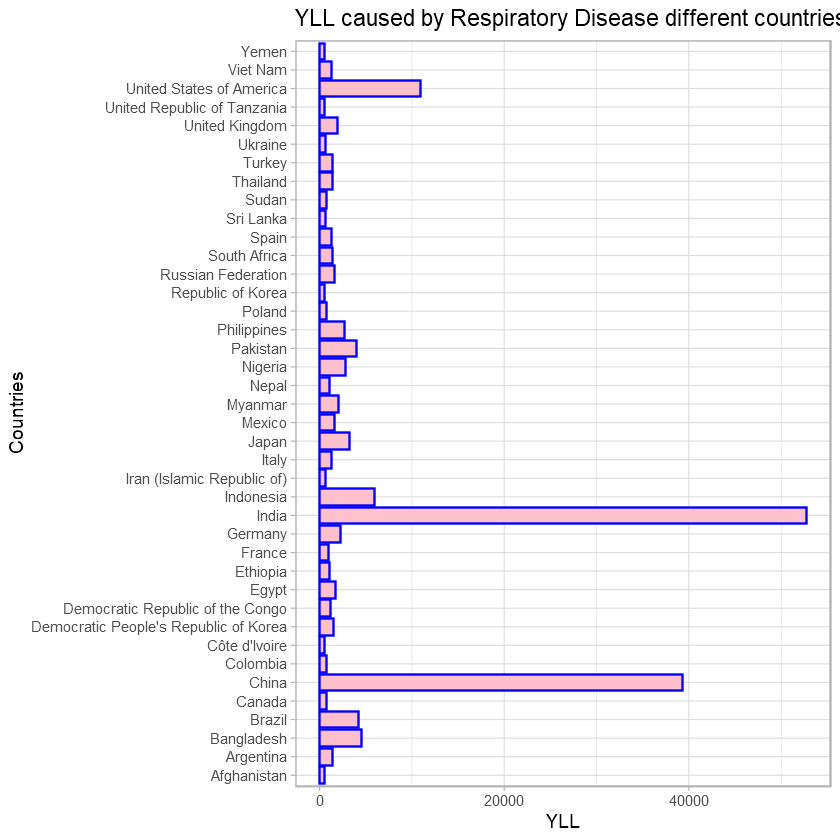

In [112]:
plot1 <- df1 %>% 
  ggplot(mapping = aes(x = Country, # your x variable
                        y = YLL)) + # your y variable
 geom_bar(colour = "blue",stat="identity", position=position_dodge(), fill = "pink") + # plotted as points 
    coord_flip() +
    labs(x = "Countries" , y = "YLL", title = "YLL caused by Respiratory Disease different countries") +
    theme_light()

plot1

#### Plot Showing the YLL due to Cardiovascular Disease for different countries

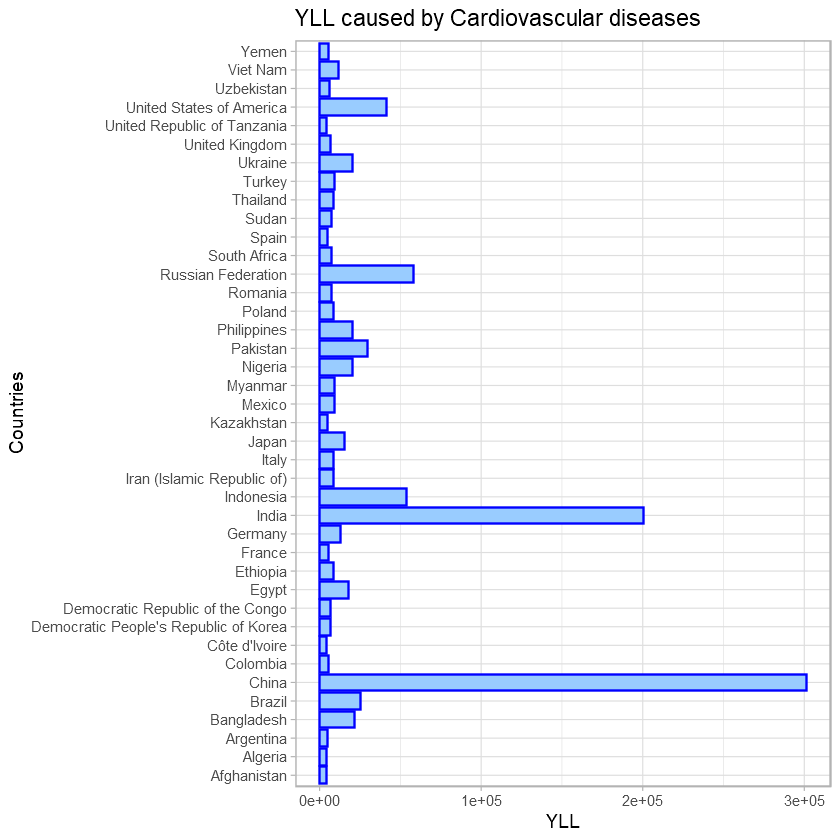

In [47]:
plot2 <- df2 %>% 
  ggplot(mapping = aes(x = Country, # your x variable
                        y = YLL)) + # your y variable
 geom_bar(colour = "blue",stat="identity", position=position_dodge(), fill = "#99CCFF") + # plotted as points 
coord_flip() +
    labs(x = "Countries" , y = "YLL", title = "YLL caused by Cardiovascular diseases") +
    theme_light()

plot2

#### Downloading PM10 Data

In [53]:
## Getting the file 
PM_10 <- read_xlsx("aap_air_quality_database_2018_v14.xlsx", sheet=4)
PM_10 %>% nrow()

New names:
* `` -> ...1
* `` -> ...2
* `` -> ...3
* `` -> ...4
* `` -> ...5
* ... and 8 more problems



[1] 3514

 Making first row as the column Name

In [54]:

colnames(PM_10) <- as.character(unlist(PM_10[1,]))
colnames(PM_10) = PM_10[1, ]
PM_10 <- PM_10[-1, ]
PM_10

Region,iso3,Country,City/Town,Year,"Annual mean, ug/m3",Temporal coverage,note on converted PM10,"Annual mean, ug/m3",Temporal coverage,note on converted PM2.5,Number and type of monitoring stations,Reference for air quality,Database version (year),status
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Europe (LMIC),ALB,Albania,Tirana,2013,32,NA,Measured,16,NA,Measured,"1 station, traffic, urban","European Environment Agency, Air quality e-reporting database",2016,NA
Europe (LMIC),ALB,Albania,Vlore,2016,23,>75%,Measured,(15)-converted value,NA,Converted,1 Urban-Background,The European Environmental Agency (EEA) [downloaded 2018/04/14],2018,NA
Europe (LMIC),ALB,Albania,Vrith,2015,20,>75%,Measured,13,>75%,Measured,1 Urban-Background,The European Environmental Agency (EEA) [downloaded 2018/04/14],2018,NA
Europe (HIC),AND,Andorra,Escaldes-Engordany,2017,19,NA,Measured,10,NA,Measured,NA,"Govern D'Andorra, Ministeri de Medi Ambient, Agricultura i Sostenibilitat",2018,NA
Eastern Mediterranean (HIC),ARE,United Arab Emirates,Abu Dhabi,2015,150,NA,Measured,(61)-converted value,NA,Converted,"1 City Centre, 2 Industrial, 1 Road Side, 4 Urban/ Residential",Environment Agency - Abu Dhabi,2018,NA
Eastern Mediterranean (HIC),ARE,United Arab Emirates,Al Ain,2015,122,NA,Measured,(50)-converted value,NA,Converted,"1 City Centre, 1 Regional Background, 1 Road Side, 3 Urban/ Residential",Environment Agency - Abu Dhabi,2018,NA
Eastern Mediterranean (HIC),ARE,United Arab Emirates,Al Gharbia,2015,153,NA,Measured,(63)-converted value,NA,Converted,"1 City Centre, 1 Industrial, 1 Regional Background, 1 Regional Background / Industrial, 1 Urban/ Residential",Environment Agency - Abu Dhabi,2018,NA
Eastern Mediterranean (HIC),ARE,United Arab Emirates,Al Gharbia - Bida Zayed,2013,146,NA,Measured,(62)-converted value,NA,Converted,"1 station, urban/residential","Emirate of Abu Dhabi, Environmental Statistics 2013, SCAD",2016,NA
Eastern Mediterranean (HIC),ARE,United Arab Emirates,Al Gharbia - Gayathi,2013,145,NA,Measured,(61)-converted value,NA,Converted,"1 station, urban","Emirate of Abu Dhabi, Environmental Statistics 2013, SCAD",2016,NA


#### Choosing columns which are required as we are not taking data of PM2.5 as of now. 
#### Removing information about city and towns
#### Removing Temporal coverage in the dataset. 

In [55]:

PM_10 <- PM_10[,c(2,3,5,6)]
PM_10

iso3,Country,Year,"Annual mean, ug/m3"
<chr>,<chr>,<chr>,<chr>
ALB,Albania,2013,32
ALB,Albania,2016,23
ALB,Albania,2015,20
AND,Andorra,2017,19
ARE,United Arab Emirates,2015,150
ARE,United Arab Emirates,2015,122
ARE,United Arab Emirates,2015,153
ARE,United Arab Emirates,2013,146
ARE,United Arab Emirates,2013,145


#### Filtering out the Data for only 2016

In [56]:
PM_10 <- PM_10 %>% filter(Year == 2016)

In [117]:
PM_10 %>% nrow()

[1] 2467

#### Renaming the columns using function rename

In [57]:
## Units - Micron  gram/mere cube 
## renaming the column
PM_10 <- PM_10 %>% rename("PM10" = "Annual mean, ug/m3")
PM_10 

iso3,Country,Year,PM10
<chr>,<chr>,<chr>,<chr>
ALB,Albania,2016,23
ARG,Argentina,2016,27
AUS,Australia,2016,16
AUS,Australia,2016,18
AUS,Australia,2016,15
AUS,Australia,2016,13
AUS,Australia,2016,15
AUS,Australia,2016,16
AUS,Australia,2016,13


#### Converting into Numeric column

In [58]:
as.numeric(PM_10$PM10) -> PM_10$PM10

In [120]:
PM_10 %>% nrow()

[1] 2467

#### Taking mean of PM10 values after grouping by countries. We have taken mean for PM10 values as PM10 for different city or town is given for each country

In [59]:
## Grouping by Country column 
df2 <- PM_10 %>% group_by(Country,iso3) %>% summarise(PM10 = mean(PM10)) 
#df2
df2 <- df2 %>% arrange(desc(PM10)) 
colnames(df2)[2] <- "ISO_CODE"
df2 %>% nrow()
df2 %>% write.csv("PM10.csv")

[1] 60

#### Plotting PM10 for different countries

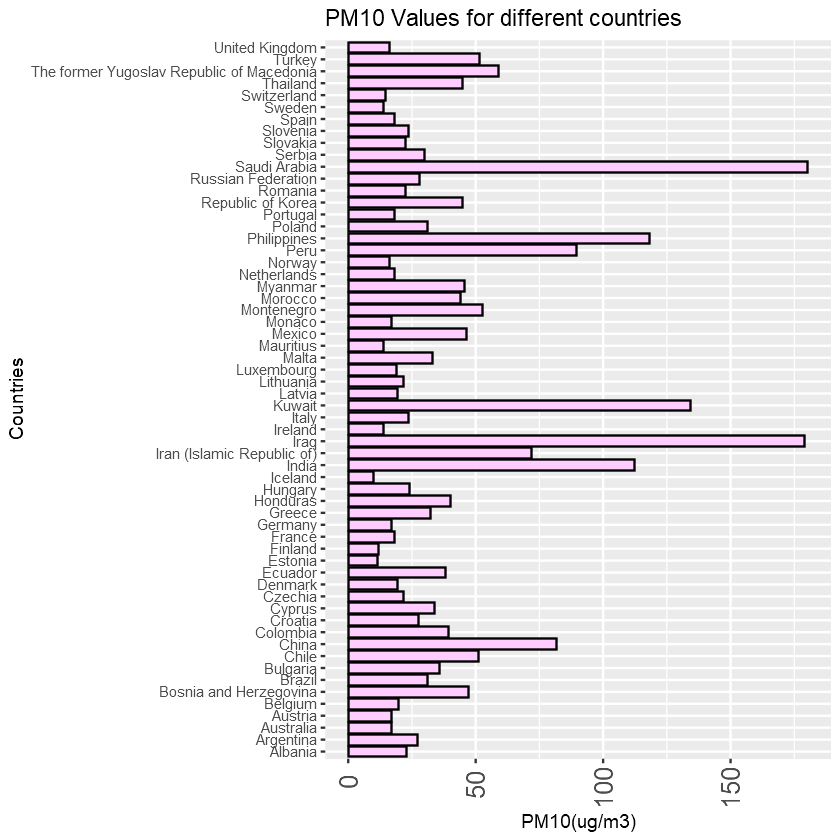

In [60]:
plot3 <- df2 %>% 
  ggplot(mapping = aes(x = Country, # your x variable
                        y = PM10)) + # your y variable
 geom_bar(colour = "black",stat="identity", position=position_dodge(), fill = "#FFCCFF") + # plotted as points 
    labs(x = "Countries" , y = "PM10(ug/m3)", title = "PM10 Values for different countries") + coord_flip() +
     theme(axis.text.x = element_text(angle=90,size=15,vjust=0.5,hjust = 0.7)) 

plot3

#### Grouping By countries for our dataset which contains YLL for filtered diseases related to air pollution and taking aggregate for each country as summation of YLL

In [61]:
DF1 <- FilteredDF %>% group_by(Country,ISO_CODE) %>% summarise(YLL = sum(YLL))

In [124]:
DF1 %>% nrow()

[1] 183

In [125]:
df2 %>% nrow()

[1] 60

In [62]:
colnames(df2)[2] <- "ISO_CODE"

##### Finding which countries are not present in the dataset with YLL but present in the dataset with PM10. There is only one country of df2(Dataset for PM10 level) which is not present in DF1(Dataset for YLL for different countries) hence if we merge the two dataset using ISO_CODE we are getting 59 rows. If we join using country then we are getting count as 58 because name of the country Czechia is different for both the Dataset

In [63]:
anti_join(df2, DF1, by = "ISO_CODE")

Country,ISO_CODE,PM10
<chr>,<chr>,<dbl>
Monaco,MCO,17


In [64]:
total <- merge(x = DF1,y = df2,by="ISO_CODE")
total %>% nrow()
total %>% na.omit() %>% nrow
total 

[1] 59

[1] 59

ISO_CODE,Country.x,YLL,Country.y,PM10
<chr>,<chr>,<dbl>,<chr>,<dbl>
ALB,Albania,867.61999,Albania,23.00000
ARG,Argentina,7419.05474,Argentina,27.00000
AUS,Australia,2347.91032,Australia,16.85185
AUT,Austria,1380.17682,Austria,16.81633
BEL,Belgium,1706.65922,Belgium,19.89583
BGR,Bulgaria,3789.02393,Bulgaria,35.76923
BIH,Bosnia and Herzegovina,1162.30115,Bosnia and Herzegovina,47.00000
BRA,Brazil,34119.13736,Brazil,31.21212
CHE,Switzerland,937.37966,Switzerland,14.72603


Cleaning the table total which contains YLL and PM10 level for each country

In [65]:
total <- total[,-c(4)]
colnames(total)[2] <- "Country"

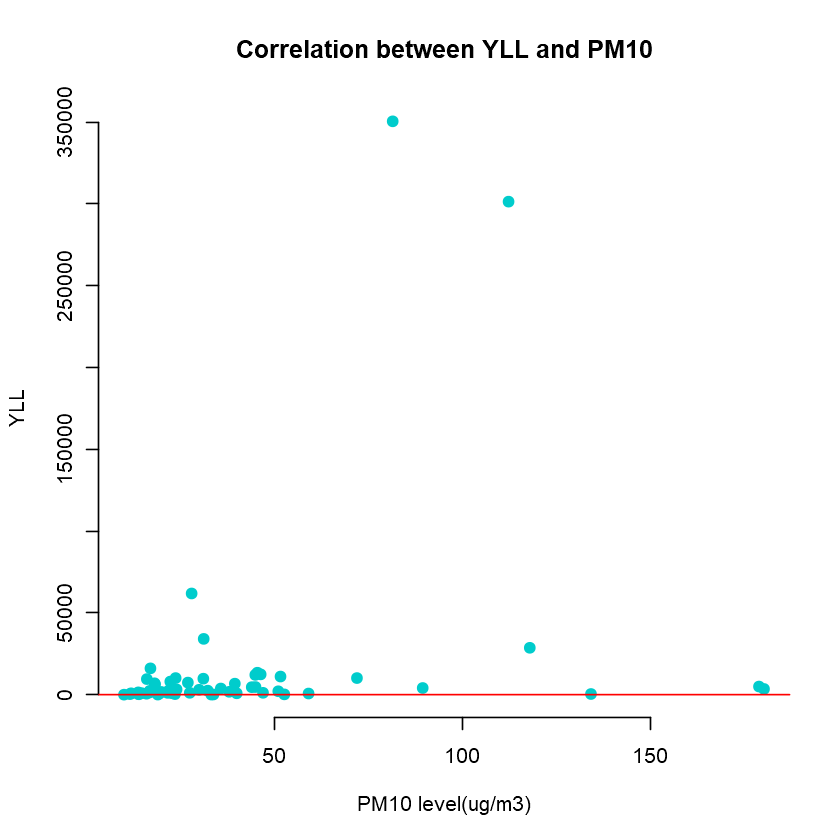

In [66]:
# Plot with main and axis titles
# Change point shape (pch = 19) and remove frame.
plot(total$PM10, total$YLL, main = "Correlation between YLL and PM10",
     xlab = "PM10 level(ug/m3)", ylab = "YLL",
     pch = 19, frame = FALSE, col = "#00CCCC")
abline(lm(total$PM10 ~ total$YLL, data = total), col = "red")

#### Reading Data for PM_2.5 --> code for PM2.5

In [67]:
file4 <- read_csv("pm_2.5.csv")
file4

Parsed with column specification:
cols(
  Country = col_character(),
  `Concentrations of fine particulate matter (PM2.5)_2` = col_character(),
  Range = col_character(),
  Min = col_double(),
  Max = col_double()
)



Country,Concentrations of fine particulate matter (PM2.5)_2,Range,Min,Max
<chr>,<chr>,<chr>,<dbl>,<dbl>
Afghanistan,53.2 [40.1-75.8],[40.1-75.8],40.1,75.8
Albania,17.9 [16.3-20.6],[16.3-20.6],16.3,20.6
Algeria,35.2 [19.8-71.9],[19.8-71.9],19.8,71.9
Andorra,9.9 [9.8-12.6],[9.8-12.6],9.8,12.6
Angola,27.9 [16.0-53.8],[16.0-53.8],16.0,53.8
Antigua and Barbuda,17.9 [10.4-34.1],[10.4-34.1],10.4,34.1
Argentina,11.8 [9.8-19.0],[9.8-19.0],9.8,19.0
Armenia,30.5 [20.1-45.9],[20.1-45.9],20.1,45.9
Australia,7.2 [7.4-9.7],[7.4-9.7],7.4,9.7


Changing the column names for the  PM2.5 dataset

In [68]:
colnames(file4)[2] <- "PM2.5"
colnames(file4)[4] <- "MinPM2.5"
colnames(file4)[5] <- "MaxPM2.5"
library(stringr)
file4


Country,PM2.5,Range,MinPM2.5,MaxPM2.5
<chr>,<chr>,<chr>,<dbl>,<dbl>
Afghanistan,53.2 [40.1-75.8],[40.1-75.8],40.1,75.8
Albania,17.9 [16.3-20.6],[16.3-20.6],16.3,20.6
Algeria,35.2 [19.8-71.9],[19.8-71.9],19.8,71.9
Andorra,9.9 [9.8-12.6],[9.8-12.6],9.8,12.6
Angola,27.9 [16.0-53.8],[16.0-53.8],16.0,53.8
Antigua and Barbuda,17.9 [10.4-34.1],[10.4-34.1],10.4,34.1
Argentina,11.8 [9.8-19.0],[9.8-19.0],9.8,19.0
Armenia,30.5 [20.1-45.9],[20.1-45.9],20.1,45.9
Australia,7.2 [7.4-9.7],[7.4-9.7],7.4,9.7


Removing brackets from the column PM2.5.

In [69]:
file4$PM2.5 <- file4$PM2.5 %>% str_replace( " \\[.*\\]", "")
file4 <- file4[,-c(3)]
file4 

Country,PM2.5,MinPM2.5,MaxPM2.5
<chr>,<chr>,<dbl>,<dbl>
Afghanistan,53.2,40.1,75.8
Albania,17.9,16.3,20.6
Algeria,35.2,19.8,71.9
Andorra,9.9,9.8,12.6
Angola,27.9,16.0,53.8
Antigua and Barbuda,17.9,10.4,34.1
Argentina,11.8,9.8,19.0
Armenia,30.5,20.1,45.9
Australia,7.2,7.4,9.7


In [141]:
file4 %>% nrow()

[1] 194

In [142]:
total %>% nrow()

[1] 59

There are three countries which are present in total(merged dataset with PM10 and YLL) but not in file4(PM2.5 dataset), thus total count after merging these dataset will be 56 rows.

In [70]:
anti_join(total, file4, by = "Country")

ISO_CODE,Country,YLL,PM10
<chr>,<chr>,<dbl>,<dbl>
CZE,Czech Republic,2384.838,21.85393
GBR,United Kingdom,9548.587,16.08108
MKD,The former Yugoslav Republic of Macedonia,732.864,59.12500


In [73]:
file4<-file4%>%mutate(ISO_CODE=countrycode(file4$Country,'country.name',"iso3c"))

Warning message in countrycode(file4$Country, "country.name", "iso3c"):
"Some values were not matched unambiguously: Eswatini
"


In [74]:
file4[59,5] <- "SWZ"

In [209]:
file4 %>% nrow()

[1] 194

Merging the dataset with PM10 and YLL Values with PM2.5 Pollutants

In [75]:
DF1 <- merge(total,file4,by="Country")
DF1

Country,ISO_CODE.x,YLL,PM10,PM2.5,MinPM2.5,MaxPM2.5,ISO_CODE.y
<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<chr>
Albania,ALB,867.61999,23.00000,17.9,16.3,20.6,ALB
Argentina,ARG,7419.05474,27.00000,11.8,9.8,19.0,ARG
Australia,AUS,2347.91032,16.85185,7.2,7.4,9.7,AUS
Austria,AUT,1380.17682,16.81633,12.4,12.1,12.8,AUT
Belgium,BEL,1706.65922,19.89583,12.9,12.4,13.5,BEL
Bosnia and Herzegovina,BIH,1162.30115,47.00000,27.3,23.7,30.7,BIH
Brazil,BRA,34119.13736,31.21212,11.5,10.9,14.9,BRA
Bulgaria,BGR,3789.02393,35.76923,18.8,18.3,20.6,BGR
Chile,CHL,2106.86709,51.06061,21.0,19.5,22.0,CHL


In [145]:
DF1 %>% nrow()

[1] 56

#### Plot Showing PM2.5 level for different countries

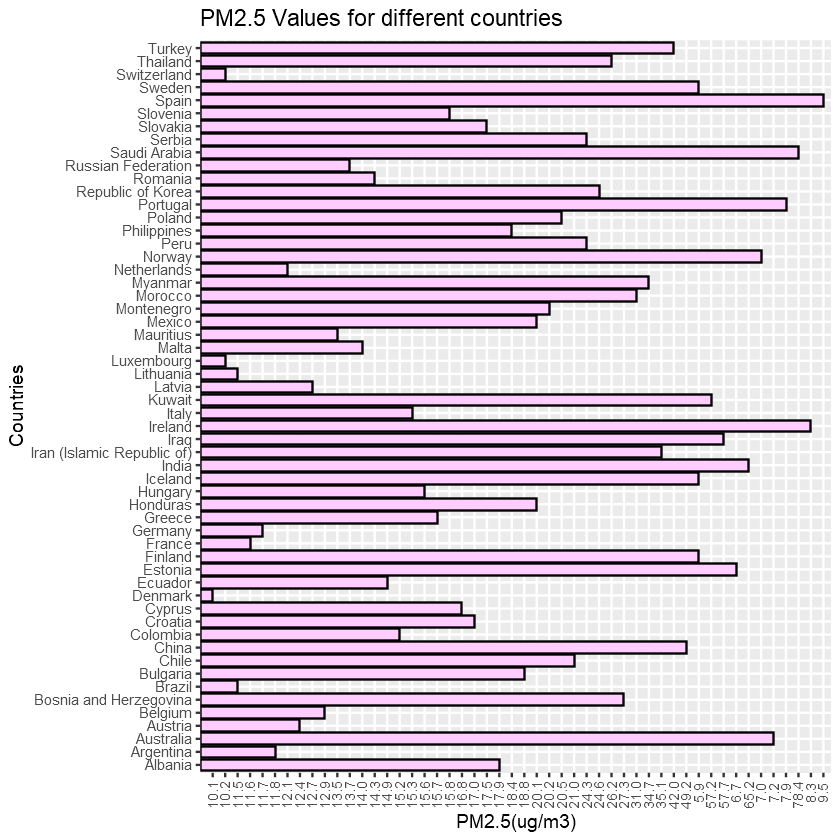

In [146]:
plot4 <- DF1 %>% 
  ggplot(mapping = aes(x = Country, # your x variable
                        y = PM2.5)) + # your y variable
 geom_bar(colour = "black",stat="identity", position=position_dodge(), fill = "#FFCCFF") + # plotted as points 
    labs(x = "Countries" , y = "PM2.5(ug/m3)", title = "PM2.5 Values for different countries") + coord_flip() +
     theme(axis.text.x = element_text(angle=90,size=8,vjust=0.5,hjust = 0.7)) 

plot4

#### Choropleth showing different countries and itsPM2.5 concentration

#### Changing the Column to double datatype

In [147]:
as.numeric(DF1$PM2.5) -> DF1$PM2.5

#### Plotting Different Particulate matters

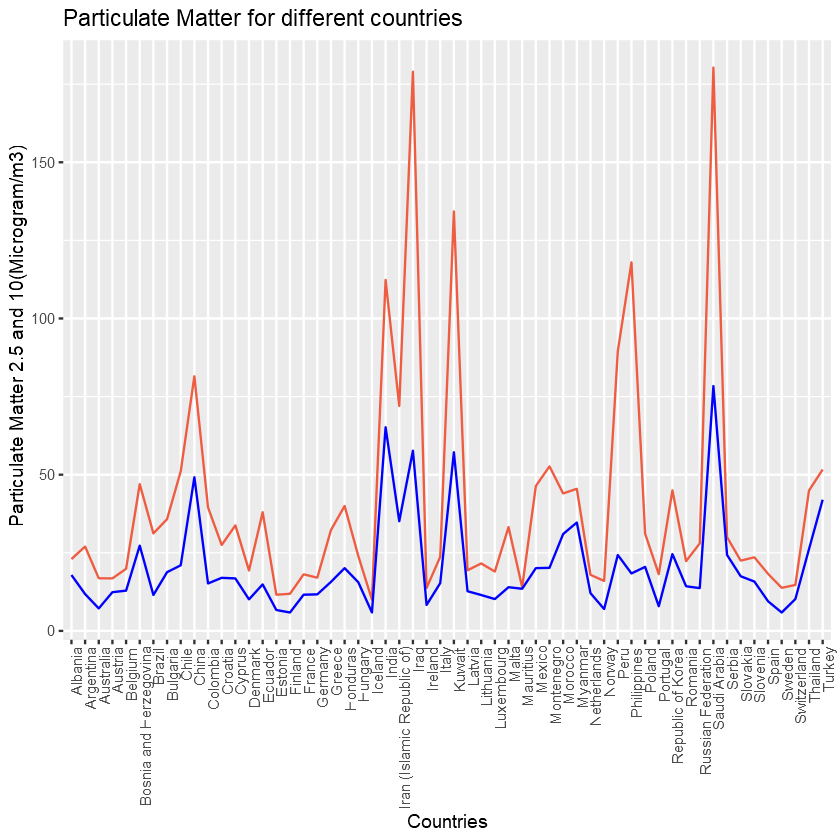

In [293]:
ggplot()+geom_line(data = DF1,aes(x=Country,y=PM10,group=1),color='tomato2')+
        geom_line(data = DF1,aes(x=Country,y=PM2.5,group=2),color='blue') + 
        theme(axis.text.x = element_text(angle = 90, hjust = 1))+
        xlab("Countries")+
        ylab("Particulate Matter 2.5 and 10(Microgram/m3)") + labs(title = "Particulate Matter for different countries")

#### Plot showing correlation of YLL with PM2.5 for different countries.

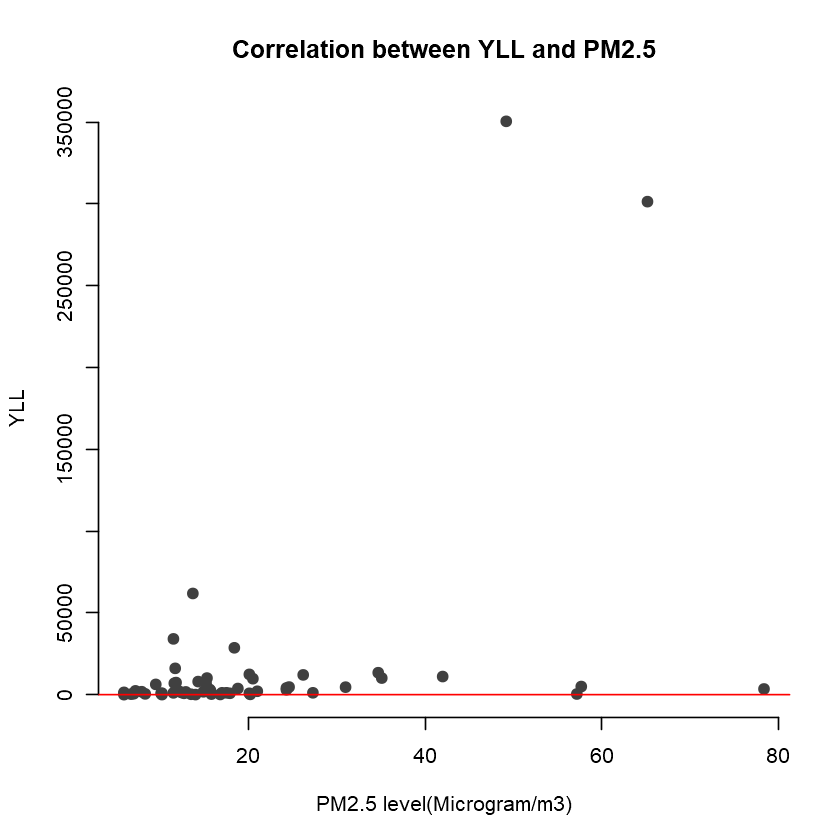

In [292]:
# Plot with main and axis titles
# Change point shape (pch = 19) and remove frame.
plot(DF1$PM2.5, DF1$YLL, main = "Correlation between YLL and PM2.5",
     xlab = "PM2.5 level(Microgram/m3)", ylab = "YLL",
     pch = 19, frame = FALSE, col = "#404040")
abline(lm(DF1$PM2.5 ~ DF1$YLL, data = DF1), col = "red")

### Crop Dataset

#### Taking Data from PDF

In [242]:
Crop_Production <- 'crop.pdf'

#### Reading Data which is in PDF format

In [243]:
# Extracting the tables inside pdf across all pages
out <- extract_tables(Crop_Production)
glimpse(out)
out[[5]]
out[[3]]->crop_3
out[[4]][-1,]->crop_4
do.call(rbind,list(crop_3,crop_4))->final
final_df<-as.data.frame(final)

colnames(final_df) <- as.character(unlist(final_df[1,]))
final_df[-1,]->final_df


List of 6
 $ : chr [1:38, 1:12] "Country" "Albania" "Austria" "Belgium" ...
 $ : chr [1:19, 1:12] "Country" "Paraguay" "Peru" "Poland" ...
 $ : chr [1:38, 1:12] "Country" "Albania" "Austria" "Belgium" ...
 $ : chr [1:19, 1:12] "Country" "Paraguay" "Peru" "Poland" ...
 $ : chr [1:38, 1:12] "Country" "Albania" "Austria" "Belgium" ...
 $ : chr [1:19, 1:12] "Country" "Paraguay" "Peru" "Poland" ...


Country,0 to 1,1 to 2,2 to 5,5 to 10,10 to 20,20 to 50,50 to 100,100 to 200,200 to 500,500 to 1000,1000 to 100000
Albania,4.21,7.86,14.22,3.37,1.97,0.02,0.04,0.00,0.00,0.00,0.00
Austria,0.00,0.09,1.17,2.69,18.62,146.49,191.30,102.35,0.00,0.00,0.00
Belgium,0.00,0.08,1.34,4.13,17.00,103.24,151.84,137.79,0.00,0.00,0.00
Bosnia and Herzegovina,12.08,6.32,18.35,7.59,0.94,0.01,0.10,0.04,0.03,0.00,0.00
Brazil,13.08,15.78,28.42,26.07,44.03,73.75,52.36,47.43,67.26,62.85,219.28
Bulgaria,3.38,0.00,5.18,6.18,8.40,19.77,22.01,433.20,0.00,0.00,0.00
Burkina Faso,1.98,5.06,21.29,27.90,25.32,41.56,28.12,15.99,14.60,4.31,77.70
Cambodia,0.07,0.12,0.25,0.31,0.22,0.14,0.01,0.01,0.01,0.00,0.00
Colombia,3.98,14.08,0.00,15.78,19.15,23.90,15.31,12.04,12.59,7.46,22.16
Costa Rica,0.09,0.25,1.16,1.83,1.95,2.45,2.08,36.80,0.00,0.00,0.00


#### Adding ISO code using countrycode package

In [244]:
final_df<-final_df%>%mutate(ISO=countrycode(final_df$Country,'country.name',"iso3c"))

#### Saving the crop_Data as wranging for this dataset has been done in Julia

In [245]:
final_df %>% write.csv("crop_data.csv")

#### Reading the Crop Data again as we need to merge this with our Air Pollutants dataset 

In [5]:
Crop_Production <- read_csv("Crop.csv")

Parsed with column specification:
cols(
  ISO_CODE = col_character(),
  Crop_Produced = col_double(),
  Country = col_character()
)



In [6]:
Crop_Production

ISO_CODE,Crop_Produced,Country
<chr>,<dbl>,<chr>
ALB,52.49,Albania
AUT,519.36,Austria
BEL,662.91,Belgium
BIH,94.25,Bosnia and Herzegovina
BRA,2561.09,Brazil
BGR,820.04,Bulgaria
BFA,492.83,Burkina Faso
KHM,1.77,Cambodia
COL,205.15,Colombia


In [253]:
df2

Country,ISO_CODE,PM10
<chr>,<chr>,<dbl>
Saudi Arabia,SAU,180.33333
Iraq,IRQ,179.00000
Kuwait,KWT,134.28571
Philippines,PHL,118.00000
India,IND,112.35000
Peru,PER,89.50000
China,CHN,81.51351
Iran (Islamic Republic of),IRN,72.00000
The former Yugoslav Republic of Macedonia,MKD,59.12500


### Merging PM10 and PM2.5

In [77]:
Pollutants <- merge(x = df2,y = file4,by="ISO_CODE")

In [78]:
Pollutants[,-c(4)]

ISO_CODE,Country.x,PM10,PM2.5,MinPM2.5,MaxPM2.5
<chr>,<chr>,<dbl>,<chr>,<dbl>,<dbl>
ALB,Albania,23.00000,17.9,16.3,20.6
ARG,Argentina,27.00000,11.8,9.8,19.0
AUS,Australia,16.85185,7.2,7.4,9.7
AUT,Austria,16.81633,12.4,12.1,12.8
BEL,Belgium,19.89583,12.9,12.4,13.5
BGR,Bulgaria,35.76923,18.8,18.3,20.6
BIH,Bosnia and Herzegovina,47.00000,27.3,23.7,30.7
BRA,Brazil,31.21212,11.5,10.9,14.9
CHE,Switzerland,14.72603,10.2,10.0,10.6


In [79]:
colnames(Pollutants)[2] <- "Country"

### Taking GHG emission

In [7]:
GHG <- read_csv("GHG.csv")

Parsed with column specification:
cols(
  Country = col_character(),
  GHG_Emission = col_double(),
  ISO_CODE = col_character()
)



In [8]:
GHG <- as.data.frame(GHG)

In [9]:
GHG

Country,GHG_Emission,ISO_CODE
<chr>,<dbl>,<chr>
Australia,69172116.8,AUS
Austria,10379359.2,AUT
Belgium,18340125.2,BEL
Canada,90979340.3,CAN
Czech Republic,19641468.2,CZE
Denmark,9419343.1,DNK
Finland,14766015.2,FIN
France,68409692.4,FRA
Germany,138000816.7,DEU


In [10]:
GHG %>% nrow()

[1] 45

#### Taking Crop Production Data set and performing plotly choropleth

In [12]:
crop <- read_csv("Crop.csv")

Parsed with column specification:
cols(
  ISO_CODE = col_character(),
  Crop_Produced = col_double(),
  Country = col_character()
)



In [13]:
crop


ISO_CODE,Crop_Produced,Country
<chr>,<dbl>,<chr>
ALB,52.49,Albania
AUT,519.36,Austria
BEL,662.91,Belgium
BIH,94.25,Bosnia and Herzegovina
BRA,2561.09,Brazil
BGR,820.04,Bulgaria
BFA,492.83,Burkina Faso
KHM,1.77,Cambodia
COL,205.15,Colombia


In [85]:
library(plotly)
df <- crop

# light grey boundaries
l <- list(color = toRGB("grey"), width = 0.5)

# specify map projection/options
g <- list(
  showframe = FALSE,
  showcoastlines = FALSE,
  projection = list(type = 'Mercator')
)

p <- plot_geo(df) %>%
  add_trace(
    z = ~Crop_Produced, color = ~Crop_Produced, colors = 'Reds',
    text = ~Country, locations = ~ISO_CODE, marker = list(line = l)
  ) %>%
  colorbar(title = 'Crop Produced') %>%
  layout(
    title = '2016 Crop Production Dataset',
    geo = g
  )

p

HTML widgets cannot be represented in plain text (need html)

In [86]:
Crop_Prod <- crop
Final_Dataset_CROP <- merge(x = Crop_Prod,y = Pollutants,by="ISO_CODE")
colnames(Final_Dataset_CROP)[2] <- "Crop_Produced"
Final_Dataset_CROP <- Final_Dataset_CROP[,-c(3,4,8)]



Warning message in merge.data.frame(x = Crop_Prod, y = Pollutants, by = "ISO_CODE"):
"column name 'Country.y' is duplicated in the result"


ERROR: Error in FUN(left, right): non-numeric argument to binary operator


In [90]:
colnames(Final_Dataset_CROP)[4] <- "Country"

In [91]:
Final_Dataset_CROP

ISO_CODE,Crop_Produced,PM10,Country,PM2.5,MaxPM2.5
<chr>,<dbl>,<dbl>,<chr>,<chr>,<dbl>
ALB,52.49,23.00000,Albania,17.9,20.6
AUT,519.36,16.81633,Austria,12.4,12.8
BEL,662.91,19.89583,Belgium,12.9,13.5
BGR,820.04,35.76923,Bulgaria,18.8,20.6
BIH,94.25,47.00000,Bosnia and Herzegovina,27.3,30.7
BRA,2561.09,31.21212,Brazil,11.5,14.9
COL,205.15,39.50000,Colombia,15.2,23.4
CYP,2.26,33.80000,Cyprus,16.8,19.4
DEU,2094.13,17.03876,Germany,11.7,12.2


In [93]:
Final_Dataset_CROP <- merge(x = Final_Dataset_CROP,y = GHG,by="ISO_CODE")

In [96]:
Final_Dataset_CROP <- Final_Dataset_CROP[,-c(4)]
colnames(Final_Dataset_CROP)[6] <- "Country"

In [97]:
Final_Dataset_CROP <- Final_Dataset_CROP %>% mutate(GHG_Millions_Of_Tonnes = round(GHG*0.001,digits = 0))

In [98]:
Final_Dataset_CROP

ISO_CODE,Crop_Produced,PM10,PM2.5,MaxPM2.5,Country,GHG,GHG_Millions_Of_Tonnes
<chr>,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>
AUT,519.36,16.81633,12.4,12.8,Austria,10379359,10379
BEL,662.91,19.89583,12.9,13.5,Belgium,18340125,18340
BRA,2561.09,31.21212,11.5,14.9,Brazil,73387230,73387
COL,205.15,39.50000,15.2,23.4,Colombia,18089947,18090
DEU,2094.13,17.03876,11.7,12.2,Germany,138000817,138001
DNK,343.00,19.33333,10.1,11.3,Denmark,9419343,9419
ESP,931.67,18.27686,9.5,9.9,Spain,45677902,45678
EST,34.84,11.60000,6.7,7.7,Estonia,2803614,2804
FIN,128.08,11.88889,5.9,6.2,Finland,14766015,14766


#### The Outlier we can see in the below plot is India as more crops are produced in comparison to other countries

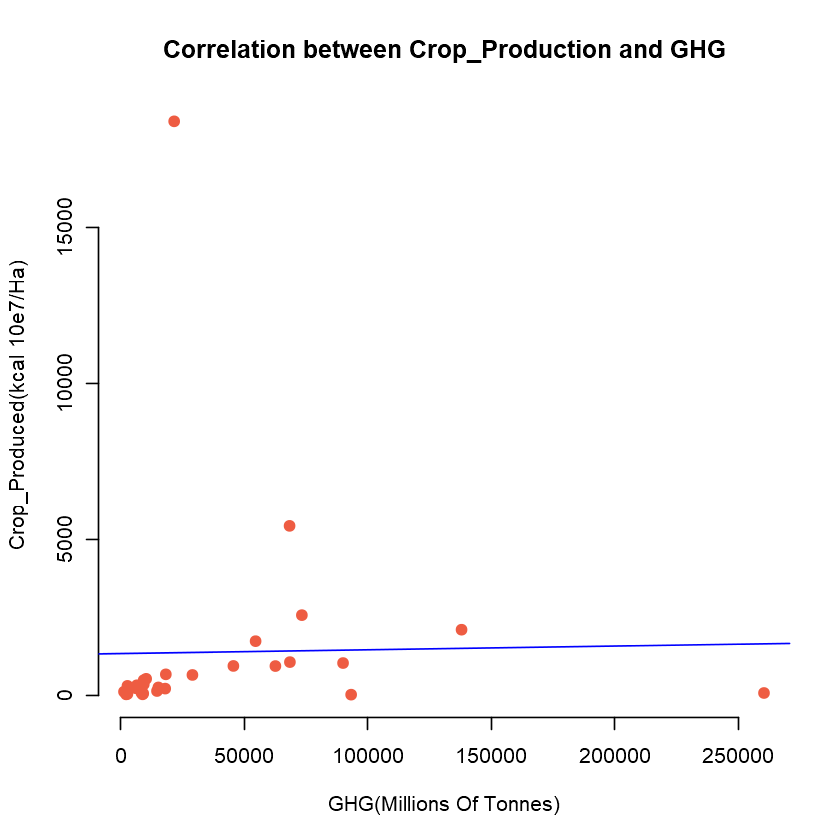

In [99]:
plot(Final_Dataset_CROP$GHG_Millions_Of_Tonnes, Final_Dataset_CROP$Crop_Produced, main = "Correlation between Crop_Production and GHG",
     xlab = "GHG(Millions Of Tonnes)", ylab = "Crop_Produced(kcal 10e7/Ha)",
     pch = 19, frame = FALSE, col = "tomato2")
abline(lm(Final_Dataset_CROP$Crop_Produced ~ Final_Dataset_CROP$GHG_Millions_Of_Tonnes, data = Final_Dataset_CROP), col = "blue")